In [2]:
# import necessary packages
import numpy as np
import matplotlib.pyplot as plt
from types import SimpleNamespace
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import visualisation as vis
from scipy.signal import find_peaks
from tqdm import tqdm
import pickle
import pandas as pd
import scipy.fft
#import line_profiler

In [8]:
def get_params(P, Q, coupling, freq_intr, elongation_speed, delay): 
   # get default parameters of system
    params = SimpleNamespace()

    # get sizes of the system 
    params.P = P            # length of PSM + tailbud
    params.Q = Q            # diameter (2D so width) of PSM and tailbud, if Q = 1 then we have 1D system

    # define the weights, connectivity matrix and coupling strength between the cells 
    if params.Q > 1:
        params.w = 4        # weight if each cell has 4 neighbours 
    else:
        params.w = 2        # weight if each cell has 2 neighbours 
    params.connectivity = connectivitymatrix(params.P, params.Q)    # connectivity matrix 
    
    params.coupling = coupling                                      # coupling strength in cell diameter ^ 2 / min

    # define length of tailbud and define posterior to anterior frequency profile
    params.freq_intr = freq_intr                    # in /mins intrinsic frequency (period of 4.46 min)
    params.NMP_length = int(2/13*params.P)          # area defined as tailbud (frequency constant)
    params.decay_length = int(12/13*params.P)       # decay length for frequency decrease

    # define delay of coupling between the cells 
    params.delay = delay #np.pi / (2 * params.freq_intr)   # typical value for mice pi*intrinsic_frequency/2
    params.connectivity_delay = connectivitymatrix(params.P, params.Q, params.delay) # connectivity matrix with delay
    
    # define the speed of elongation of the cells 
    params.elongation_speed = elongation_speed      # in cell diameters / min

    return params

def get_simul(num_tsteps, dt, params):
    ''' get_simul gets non-biological parameters for the simulation dependent on the number of timesteps and the size of the timestep
    and places these parameters in a SimpleNamespace named simul'''

    simul = SimpleNamespace()

    simul.times = np.arange(num_tsteps)*dt # array of time for plotting

    # define simulation parameters for the elongation 
    if params.elongation_speed > 0:
        simul.coarse_scale = int(np.ceil((params.elongation_speed)**-1) / dt) # time scale factor for each elongation of PSM
        simul.num_newcells = int(params.elongation_speed * dt * simul.coarse_scale) # I think I have defined this to always be 1
    else:
        simul.coarse_scale = 0
        simul.num_newcells = 0 

    # define simulation parameters for the delayed coupling
    simul.num_delay_tsteps = int(params.delay/dt)
   
    return simul

def delayed_coupling_1D(num_tsteps, dt, params):

     # get simulation parameters
    simul = get_simul(num_tsteps, dt, params)  

    # set empty arrays to put computed values for phase in 
    phase = np.zeros([params.P, num_tsteps])
    somite = np.zeros([params.P, num_tsteps])
    
    # perform changes in the phase by (delayed) coupling and elongation of the PSM
    for i in range(num_tsteps - 1):

        # phase shift because of own clock + coupling
        if i - simul.num_delay_tsteps >= 0:
            phase_delayed = phase[:, i - simul.num_delay_tsteps]
        else: 
            phase_delayed = phase[:,i]
        
        # calculate the phase shift before drift due to elongation
        phase_nodrift = Euler(phase[:,i], phase_dyn(phase[:,i], phase_delayed, params, simul)[0], dt)
    
        # plot the frequency profile of the cells at a certain time
        if i == 300:
            plt.plot(np.arange(params.P), phase_dyn(phase[:,0], phase_delayed, params, simul)[1])
        
        # shift cells due to the elongation of PSM check every time the elongation is 1 cell longer
        if i % simul.coarse_scale == 0:

            new_oscillators = np.zeros(simul.num_newcells)

            if simul.num_newcells > 0:
                new_oscillators = phase[0,i]*np.ones(simul.num_newcells)
                phase[:,i+1] = np.append(new_oscillators, phase_nodrift[: - simul.num_newcells])

                new_somite = phase_nodrift[- simul.num_newcells :] # retrieve cell that has passed through PSM
                somite[:,i+1] = np.append(new_somite, somite[: - simul.num_newcells,i])

        else:
            phase[:, i+1] = phase_nodrift
            somite[:, i+1] = somite[:, i]
            
    return phase, somite, simul

def connectivitymatrix(P, Q, delay = 0):
    '''Calculates the connectivity matrix, if necessary for a delay in the coupling between the cells'''
    k = P*Q                 # number of cells 
    M = np.zeros([k,k])     # connectivity matrix

    # calculating the connectivity matrix
    if delay == 0:
        for i in range(k):
            i_neighbour = findneigbours(i, P, Q)

            # check if the neighbours are within the range of the system
            for j in i_neighbour:
                if 0 <= j:
                    M[i, j] = 1

    else:
        for i in range(k):
            i_neighbour = find_prev_neighbours(i, P, Q, delay)

            # check if the neighbours are within the range of the system
            for j in i_neighbour:
                if 0 <= j:
                    M[i, j] = 1
    
    return M   

def findneigbours(index, P, Q):
    '''Finds neighbours of cell with index for system of P, Q cells'''
    
    # finding neighbours for line of cells
    if Q == 1:
        left = int(index - 1)
        right = int(index + 1)

        # check if the cell is on the edge of the system
        if index % P == 0:
            left = -1
        if index % P == P - 1:
            right = -1

        neighbours = [left, right]   
    # finding neighbours for 2D system of cells
    elif Q > 1: 

        left = index - 1
        right = index + 1
        up = index - P
        down = index + P

        # check if the cell is on the edge of the system
        if index % P == 0:
            left = -1
        if index % P == P - 1:
            right = -1
        if index < P:
            up = -1
        if index >= P*(Q-1):
            down = -1
        neighbours = [left, right, up, down]
                
    else: 
        print('Q should be at least 1')

    return neighbours

def find_prev_neighbours(index, P, Q, delay):
    '''Finds neighbours of cell with index for systems of P, Q cells at a previous time step'''
    left = int(index - delay - 1)
    right = int(index - delay + 1)
    up = index - P
    down = index + P

    # check if the cell is on the edge of the system
    if index - delay % P == 0:
        left = -1
    if index - delay % P == P - 1:
        right = -1
    if index < P:
        up = -1
    if index >= P*(Q-1):
        down = -1

    neighbours = [left, right, up, down]

    return neighbours



def freq(length, decay_length, params):

    PSM_length = int(length - params.NMP_length)

    freq_profile_NMP = params.freq_intr * np.ones(params.NMP_length)

    freq_converted = params.freq_intr / ( 1 - np.exp(-PSM_length/ decay_length)) 

    freq_profile_PSM = freq_converted * (1 - np.exp(- np.arange(PSM_length) / decay_length) ) #+ 1/10*freq_converted # added small offset 
    freq_profile_PSM = freq_profile_PSM[::-1]

    return np.append(freq_profile_NMP, freq_profile_PSM)

def phase_dyn(phase, phase_delayed, params, simul):
    noise = 0 # deterministic model
    
    # # define the frequency profile of the cells
    freq_profile = freq(params.P, params.decay_length, params)
    
    # calculate position of neighbours time delay * elongation speed
    delay_shift = round(params.elongation_speed * params.delay)
    if params.Q == 1:
        if delay_shift > 0:
            # if there is an elongation, calculate the shifted connectivity matrix due to time and elongation
            delayed_connectivity = np.hstack((params.connectivity[:, delay_shift:], np.zeros([params.connectivity.shape[0], delay_shift])))
            # use delayed connectivity matrix to calculate coupling between cells
            coupling_neighbours = np.sum(delayed_connectivity*np.sin(phase_delayed - phase), axis = 1)
        else: 
            # if no coupling delay, use normal connectivity matrix
            coupling_neighbours = np.sum(params.connectivity*np.sin(phase_delayed - phase), axis = 1)

        if params.elongation_speed > 0:
            phase_drift = - params.elongation_speed*(phase[1:] - phase[:-1]) # phase shift due to the speed of elongation
            phase_drift = np.append(phase_drift,0) #make right length for phase drift
            
        else:
            phase_drift = 0

        dphase_dt = freq_profile + params.coupling/params.w * coupling_neighbours + phase_drift + noise
    
    elif params.Q > 1:
        # setup arrays for the coupling
        coupled_phases = np.sin(phase_delayed.flatten() - phase.flatten())
        coupling_neighbours = np.zeros([params.P, params.Q])

        if delay_shift > 0 and params.coupling > 0:
            # if there is an elongation, calculate the previous position of the cells 
            sum_coupling = np.dot(params.connectivity_delay, coupled_phases)
            coupling_neighbours = sum_coupling.reshape(params.P, params.Q)
            # for i in range(params.P):
            #     for j in range(params.Q):

            #         #find previous position of the cell at delay_shift time steps ago
            #         prev_i = i - delay_shift
            #         prev_k = prev_i  + j * params.P
            #         prev_connection = params.connectivity[prev_k]

            #         coupling_neighbours[i,j] = np.sum(prev_connection * np.sin(phase_delayed.flatten() - phase.flatten()))

        elif delay_shift == 0 and params.coupling > 0:
            sum_coupling = np.dot(params.connectivity, coupled_phases)
            coupling_neighbours = sum_coupling.reshape(params.P, params.Q)
        
        else:
            coupling_neighbours = np.zeros([params.P, params.Q])

        # phase shift due to elongation of the PSM, this creates a drift term
        if params.elongation_speed > 0:
            phase_drift = params.elongation_speed*(phase[:-1] - phase[1:]) # phase shift due to the speed of elongation
            phase_drift = np.row_stack((np.zeros(params.Q), phase_drift)) #make right length for phase drift
            phase_drift[:params.NMP_length, :] = np.zeros([params.NMP_length, params.Q])
            
        else:
            phase_drift = np.zeros([params.P, params.Q])
        
        dphase_dt = np.tile(freq_profile[:, np.newaxis], (1, params.Q)) + params.coupling/params.w * coupling_neighbours + phase_drift + noise
    
    return dphase_dt, freq_profile, params.coupling/params.w * coupling_neighbours, phase_drift

def delayed_coupling_2D(num_tsteps, dt, params):
    'Makes a 2D simulation of the delayed coupling model'
    
    # get simulation parameters
    simul = get_simul(num_tsteps, dt, params)

    # set empty arrays to put computed values for phase in
    phase = np.zeros([int(params.P), int(params.Q), int(num_tsteps)])
    somite = np.zeros([int(params.P), int(params.Q), int(num_tsteps)])

    cells_exit = 0
    
    # perform changes in the phase by (delayed) coupling and elongation of the PSM
    for i in tqdm(range(int(num_tsteps) - 1)):

        # phase shift because of own clock + coupling
        if i - simul.num_delay_tsteps > 0:
            phase_delayed = phase[:, :, i - simul.num_delay_tsteps]
            # print('now we take a phase delay at time step', i)
        else:
            phase_delayed = phase[:, :, i]
            # if i == 0:
            #     print('no phase delay is taken')

        # calculate the phase shift before drift due to elongation
        phase_nodrift = Euler(phase[:, :, i], phase_dyn(phase[:, :, i], phase_delayed, params, simul)[0], dt)

        # shift cells due to the elongation of PSM check every time the elongation is 1 cell longer
        if params.elongation_speed > 0:

            cells_exit = np.floor((i-1)*dt*params.elongation_speed)
            cells_new_exit = np.floor(i*dt*params.elongation_speed)

            if cells_new_exit > cells_exit:
                #print(f'The somite is now {cells_exit} long at {i} time steps which is {i*dt} minutes')

                new_oscillators = phase[0, :, i] * np.ones([1, params.Q])
                phase[:, :, i + 1] = np.append(new_oscillators, phase_nodrift[: - 1 , :], axis=0)

                new_somite = phase_nodrift[- 1 :, :]  # retrieve cell that has passed through PSM
                somite[:, :, i + 1] = np.append(new_somite, somite[: - 1 , :, i], axis=0)

            else:
                phase[:, :, i + 1] = phase_nodrift
                somite[:, :, i + 1] = somite[:, :, i]
        
        else: 
            phase[:, :, i + 1] = phase_nodrift
            somite[:, :, i + 1] = somite[:, :, i]
    
    # make values of phase and somite easy to plot 
    phase = np.sin(phase)
    somite = np.sin(somite)

    return phase, somite, simul

def simulate(P, Q, coupling, freq_intr, elongation_speed, delay, num_tsteps, dt):
    '''Simulate the delayed coupling model for a 2D system'''
    
    params = get_params(P, Q, coupling, freq_intr, elongation_speed, delay)

    phase, somite, simul = delayed_coupling_2D(num_tsteps, dt, params)

    return phase, somite, simul


def Euler(x, dx_dt, dt):
    x_new = x + dx_dt*dt
    return x_new

def rolling_average(data, window_length):
    # Apply rolling average to smooth the data
    data = pd.Series(data)
    rolling = data.rolling(window=window_length, center=True)
    rolling_mean = rolling.mean()
    rolling_mean = rolling_mean.fillna(method='bfill')
    rolling_mean = rolling_mean.fillna(method='ffill')
    rolling_mean = rolling_mean.values
    return rolling_mean

def fourier_transform(data, dt):
    fs = 1 / dt  # Compute sampling frequency
    fft_result = scipy.fft.fft(data)
    frequencies = scipy.fft.fftfreq(len(fft_result), 1/fs)  # Frequency axis

    # Filter positive frequencies
    positive_mask = frequencies > 0
    positive_frequencies = frequencies[positive_mask]
    positive_magnitude = np.abs(fft_result[positive_mask])

    # Define cutoff frequency (1/500)
    f_cutoff = 1 / 400

    # Apply mask to select frequencies <= f_cutoff
    valid_mask = positive_frequencies >= f_cutoff
    filtered_frequencies = positive_frequencies[valid_mask]
    filtered_magnitude = positive_magnitude[valid_mask]

    # Compute period only for selected frequencies
    period = 1 / filtered_frequencies
    return filtered_frequencies, filtered_magnitude, period



## 1D simulation


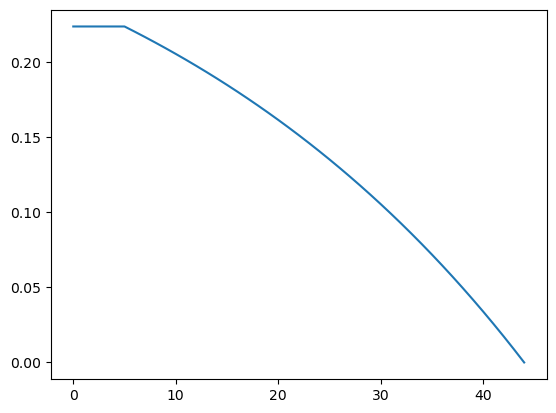

In [4]:
# get parameters of system
P = 45
Q = 1
coupling = 0.07
freq_intr = 0.224
elongation_speed = 0.255
delay = np.pi / (2 * freq_intr)

params = get_params(P, Q, coupling, freq_intr, elongation_speed, delay)

num_tsteps = 10000                   # number of time simulation steps 
dt = 0.05                           # timestep size in mins

# run simulation
phase, somite, simul = delayed_coupling_1D(num_tsteps, dt, params)

# make values of phase and somite easy to plot 
phase = np.sin(phase)
somite = np.sin(somite)

## 2D simulation

In [6]:
# get parameters of system
P = 45 # cells length
Q = 15  # cells width
coupling = 0.05
freq_intr = 2*np.pi/130 # per min for mice #0.224 # per min value for zebrafish
elongation_speed = 7/(2.5*60) #elongation speed for somites of 7 cells per 2,5 hours #0.255 # per min for zebrafish
delay = np.pi / (2 * freq_intr)

params = get_params(P, Q, coupling, freq_intr, elongation_speed, delay)

num_tsteps = int(50000)                   # number of time simulation steps 
dt = 0.05                           # timestep size in mins

# run simulation
phase2, somite2, simul2 = delayed_coupling_2D(num_tsteps, dt, params)


100%|██████████| 49999/49999 [00:19<00:00, 2543.77it/s]


### Animation of simulation

MovieWriter imagemagick unavailable; using Pillow instead.


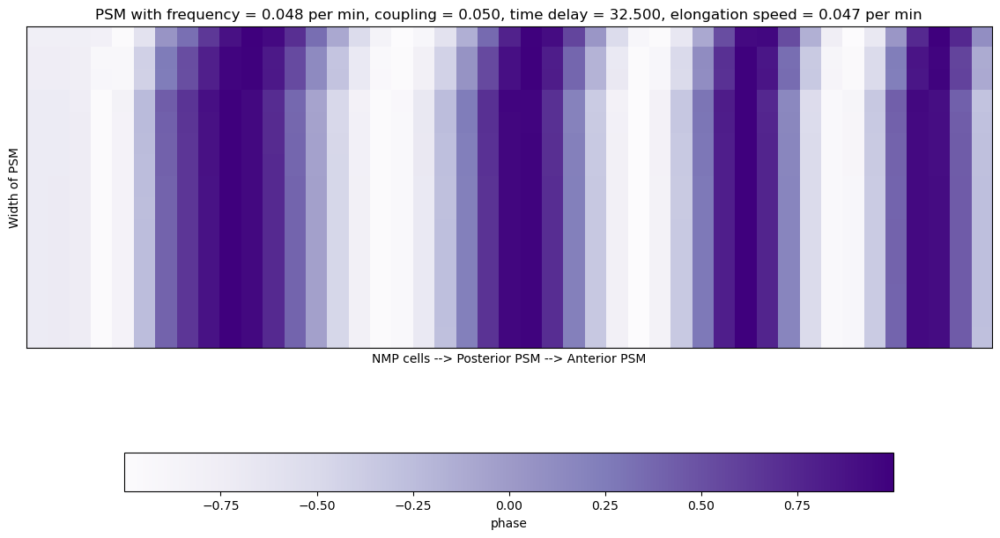

In [9]:
vis.animate_2D(phase2[:,:, ::int(num_tsteps/200)], interval = 10, plot_save=False, filename=f'mov_mouse_{params.coupling:.3f}_coupling_{params.delay:.3f}_delay.gif', title = f'PSM with frequency = {params.freq_intr:.3f} per min, coupling = {params.coupling:.3f}, time delay = {params.delay:.3f}, elongation speed = {params.elongation_speed:.3f} per min')


## Plot some results for varying coupling strengths and delays

In [9]:
# get parameters of system
P = 45 # cells length
Q = 15  # cells width
coupling = 0.01
freq_intr = 2*np.pi/130 # per min for mice #0.224 # per min value for zebrafish
elongation_speed = 7/(2.5*60) #elongation speed for somites of 7 cells per 2,5 hours #0.255 # per min for zebrafish
delay = np.pi / (2 * freq_intr)
num_tsteps = int(5e4)                   # number of time simulation steps 
dt = 0.05     

coupling = np.array([0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07])
delay = np.pi / (2 * freq_intr) * np.array([0,1,3]) 

phases = np.zeros([len(coupling), len(delay), P, Q, num_tsteps])

for i in range(len(coupling)):
    for j in range(len(delay)):

        print(f'coupling = {coupling[i]}, delay = {delay[j]}')
        phases[i, j], somite, simul = simulate(P, Q, coupling[i], freq_intr, elongation_speed, delay[j], num_tsteps, dt)

    

coupling = 0.0, delay = 0.0


100%|██████████| 49999/49999 [00:06<00:00, 7958.67it/s]


coupling = 0.0, delay = 32.5


100%|██████████| 49999/49999 [00:06<00:00, 7363.02it/s]


coupling = 0.0, delay = 97.5


100%|██████████| 49999/49999 [00:06<00:00, 7393.72it/s]


coupling = 0.01, delay = 0.0


100%|██████████| 49999/49999 [00:16<00:00, 3039.45it/s]


coupling = 0.01, delay = 32.5


100%|██████████| 49999/49999 [00:15<00:00, 3175.97it/s]


coupling = 0.01, delay = 97.5


100%|██████████| 49999/49999 [00:11<00:00, 4230.97it/s]


coupling = 0.02, delay = 0.0


100%|██████████| 49999/49999 [00:11<00:00, 4408.83it/s]


coupling = 0.02, delay = 32.5


100%|██████████| 49999/49999 [00:11<00:00, 4277.54it/s]


coupling = 0.02, delay = 97.5


100%|██████████| 49999/49999 [00:11<00:00, 4381.08it/s]


coupling = 0.03, delay = 0.0


100%|██████████| 49999/49999 [00:10<00:00, 4733.52it/s]


coupling = 0.03, delay = 32.5


100%|██████████| 49999/49999 [00:11<00:00, 4418.34it/s]


coupling = 0.03, delay = 97.5


100%|██████████| 49999/49999 [00:11<00:00, 4490.58it/s]


coupling = 0.04, delay = 0.0


100%|██████████| 49999/49999 [00:11<00:00, 4402.25it/s]


coupling = 0.04, delay = 32.5


100%|██████████| 49999/49999 [00:16<00:00, 3110.36it/s]


coupling = 0.04, delay = 97.5


100%|██████████| 49999/49999 [00:11<00:00, 4492.19it/s]


coupling = 0.05, delay = 0.0


100%|██████████| 49999/49999 [00:09<00:00, 5328.73it/s]


coupling = 0.05, delay = 32.5


100%|██████████| 49999/49999 [00:10<00:00, 4683.99it/s]


coupling = 0.05, delay = 97.5


100%|██████████| 49999/49999 [00:10<00:00, 4912.57it/s]


coupling = 0.06, delay = 0.0


100%|██████████| 49999/49999 [00:09<00:00, 5116.63it/s]


coupling = 0.06, delay = 32.5


100%|██████████| 49999/49999 [00:10<00:00, 4604.83it/s]


coupling = 0.06, delay = 97.5


100%|██████████| 49999/49999 [00:10<00:00, 4800.15it/s]


coupling = 0.07, delay = 0.0


100%|██████████| 49999/49999 [00:09<00:00, 5303.93it/s]


coupling = 0.07, delay = 32.5


100%|██████████| 49999/49999 [00:10<00:00, 4904.88it/s]


coupling = 0.07, delay = 97.5


100%|██████████| 49999/49999 [00:10<00:00, 4849.37it/s]


### Plotting phase profiles

Text(0.5, 1.0, 'coupling = 0.02, delay = 32.5')

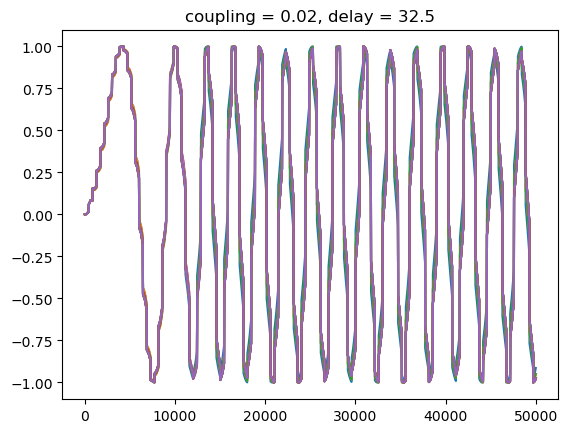

In [10]:
plt.figure()
for i in range(params.Q):
    plt.plot(phases[2,1,-1, i, :])

plt.title(f'coupling = {coupling[2]}, delay = {delay[1]}')


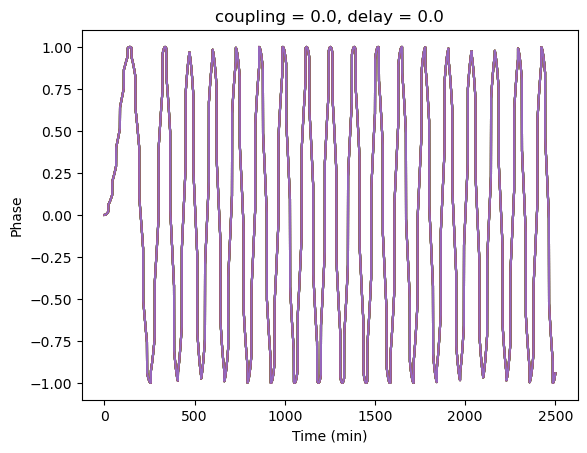

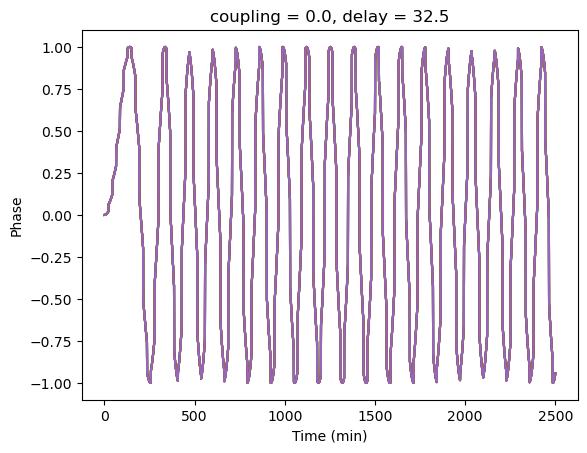

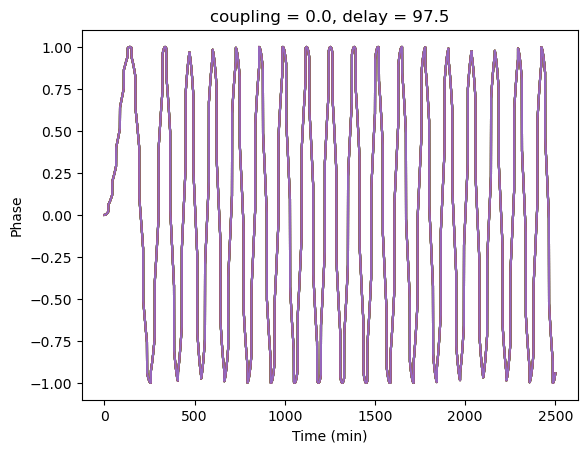

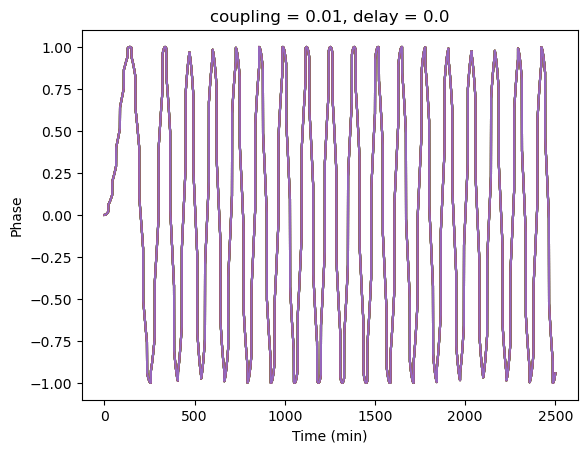

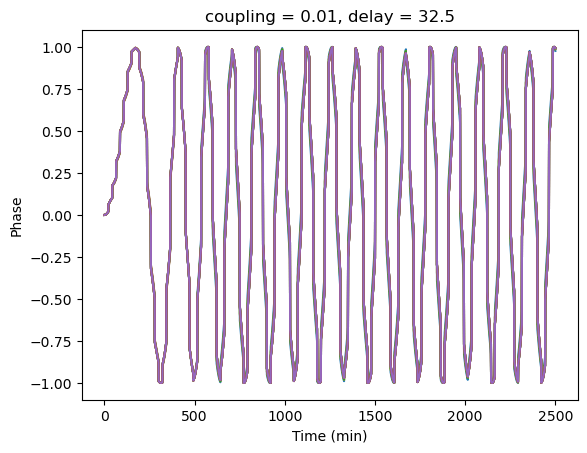

...

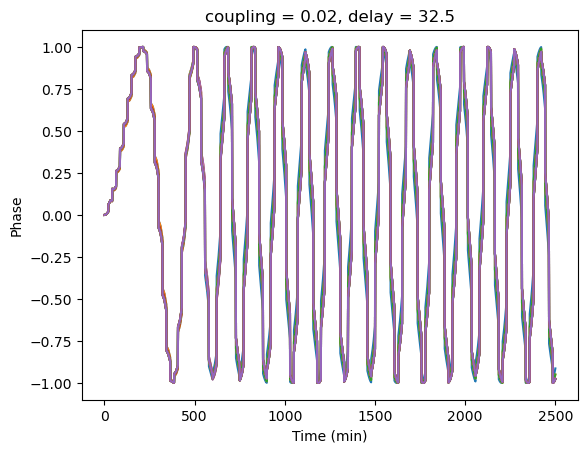

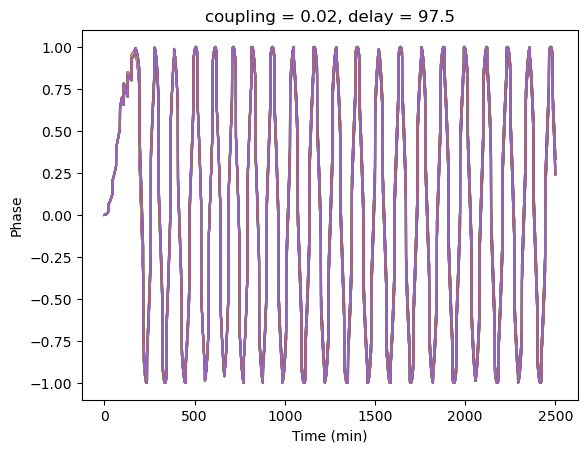

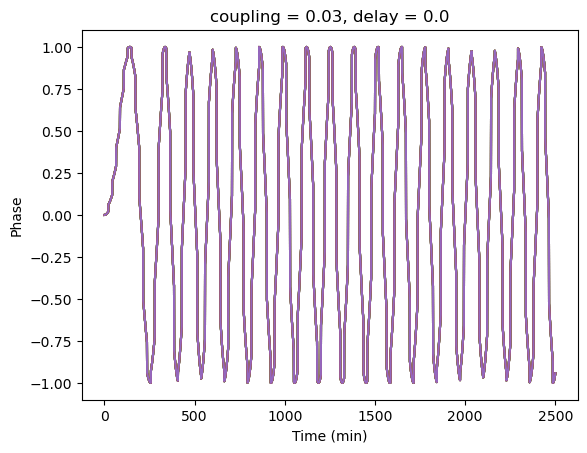

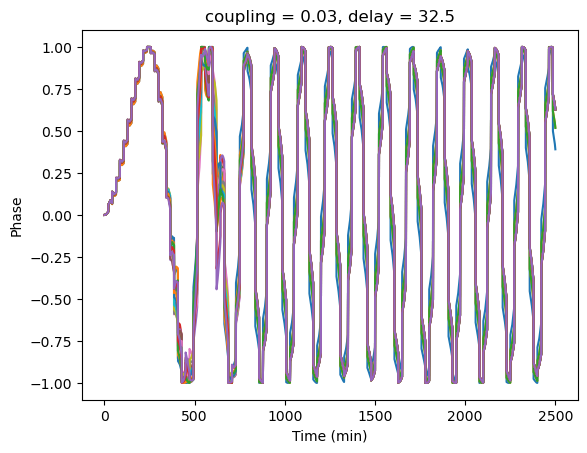

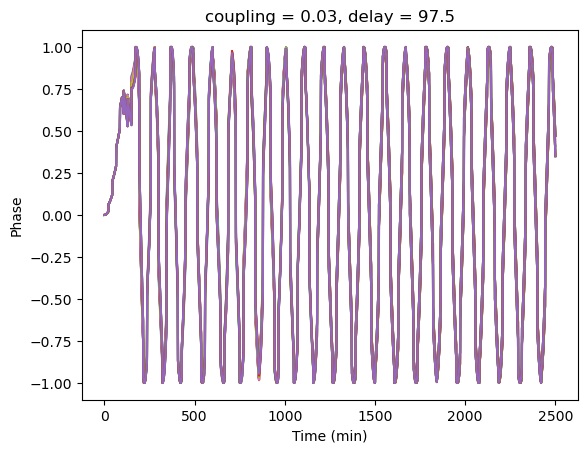

In [11]:
for i in range(4):
    for j in range(3):
        plt.figure()
        for k in range(params.Q):
            plt.plot(dt*np.arange(num_tsteps), phases[i,j,-1, k,:])
    
        plt.title(f'coupling = {coupling[i]}, delay = {delay[j]}')
        plt.xlabel('Time (min)')
        plt.ylabel('Phase')
        #plt.savefig(f'phase_profile/phase_coupling_{i}_delay_{j}.png')
        plt.show()
        

## Fourier transformations of the signals to obtain periods

NameError: name 'coupling_set' is not defined

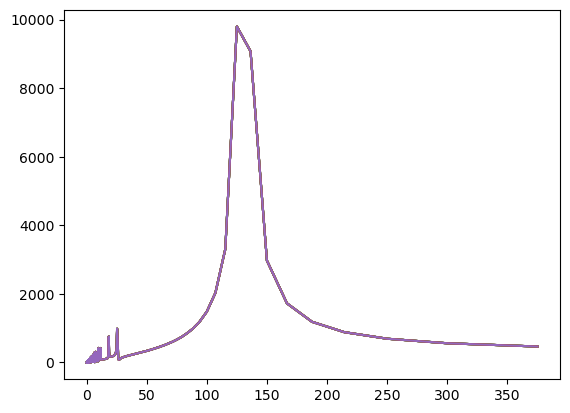

In [13]:
# Initialize storage for weighted mean and std
maxima = np.zeros((len(coupling), len(delay)))
maxima_stds = np.zeros((len(coupling), len(delay)))


for i in range(len(coupling)):
    for j in range(len(delay)):
        maxima_ = []
        
        for k in range(params.Q):
            freq, magnitude, period = fourier_transform(phases[i, j, -1, k, int(1e3/dt):], dt)
            max_period = period[np.argmax(magnitude)]
            maxima_.append(max_period)

            plt.plot(period, magnitude, label = f'Cell {k}, period = {max_period:.2f} min')	
        
        # Store results
        maxima[i,j] = np.mean(maxima_)
        maxima_stds[i,j] = np.std(maxima_)

        #print(f'Coupling = {coupling[i]}, Delay = {delay[j]}, Maximum period = {maxima[i,j]:.2f}, Std = {maxima_stds[i,j]:.2f}')


        plt.title(f'coupling = {coupling_set[i]}, delay = {delay_set[j]}')
        plt.xlabel('Period (min)')
        plt.ylabel('Magnitude')
        plt.legend()
        plt.show()


plt.figure()

for i in range(3):
    plt.errorbar(coupling, maxima[:, i], yerr=maxima_stds[:, i], label=f'Delay {delay[i]}', capsize=5, marker = 'x', ls = '--')
    
plt.xlabel('Coupling strength')
plt.ylabel('Maximum Period (min)')
plt.legend()
plt.show()



    